In [1]:
import Pkg
Pkg.add("Plots")
using Plots
Pkg.add("LinearAlgebra")

   Resolving package versions...
  No Changes to `C:\Users\Anastasia\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\Anastasia\.julia\environments\v1.10\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Anastasia\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\Anastasia\.julia\environments\v1.10\Manifest.toml`


In [2]:
using LinearAlgebra

alpha, beta = 1, 1

func(x, y) = alpha * x^2 + beta * y ^ 2
f(x) = func(x[1],x[2])
x0 = [1.0, 1.0]

2-element Vector{Float64}:
 1.0
 1.0

In [38]:
using LinearAlgebra
function df(f, x::Vector{Float64}, i, h=1e-5)
    x_plus = copy(x)
    x_minus = copy(x)
    
    x_plus[i] += h
    x_minus[i] -= h
    
    df_dx = (f(x_plus) - f(x_minus)) / (2h)
    
    return df_dx
end

function gradient(f, x::Vector{Float64})
    grad = []
    for i in 1:length(x)
        push!(grad, df(f, x, i))
    end
    return grad
end

gradient (generic function with 1 method)

### Метод Свенна для локализации минимума

In [4]:
using LinearAlgebra

function swann_method(f, x0, h=0.1)
    first = x0
    second = x0 + h
    # если функция растет, меняем направление движения
    if f(second) > f(first)
        h = -h
        first, second = second, second + h
    end
    last = second + h
    
    # увеличиваем шаг движения, если функция уменьшается
    while f(last) < f(second)
        h *= 2
        first, second, last = second, last, last + h
    end
    # перепрыгнули далеко
    if second > last
        first, second, last = last, second, first
    end

    return first, last
end

swann_method (generic function with 2 methods)

### Метод золотого сечения для поиска минимума

In [5]:
using LinearAlgebra

function golden_section_search(f, a, b, eps=1e-5)
    phi = (sqrt(5) - 1) / 2 
    x1 = b - phi * (b - a)
    x2 = a + phi * (b - a)
    
    while abs(b - a) > eps
        if f(x1) <= f(x2)
            b = x2
        else
            a = x1
        end
        x1 = b - phi * (b - a)
        x2 = a + phi * (b - a)
    end
    
    return (a + b) / 2
end

golden_section_search (generic function with 2 methods)

## Метод наискорейшего спуска

In [31]:
function gradient_descent(f, x0)
    eps1, eps2 = 1e-6, 1e-10
    x = x0
    trajectory = [copy(x)]
    
    while true
        grad = gradient(f, x)  
        prev_grad = copy(grad)
        l, r = swann_method(alpha -> f(x - alpha * grad), 1e-2)
        alpha = golden_section_search(alpha -> f(x - alpha * grad), l, r)
        
        x_new = x - alpha * grad

        if norm(x - x_new) < eps1 || norm(f(x) - f(x_new)) < eps2
            break
        end
        
        x = x_new
        push!(trajectory, copy(x))
            
        if dot(prev_grad, gradient(f, x)) > 1
            println("not ortogonal")
        end
        # println("(grad, prev_grad) = ", dot(prev_grad, gradient(f, x)))
    end
    return x, trajectory
end

x_min, trajectory = gradient_descent(f, x0)
print("Точка минимума: ", x_min, "; Количество итераций: ", length(trajectory)-1)

Точка минимума: [2.31523448426563e-9, 2.31523448426563e-9]; Количество итераций: 2

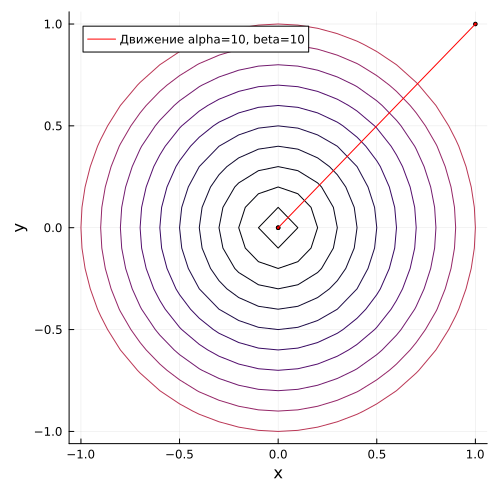

In [32]:
alpha, beta = 10, 10
func(x, y) = alpha * x^2 + beta * y ^ 2
f(x) = func(x[1],x[2])
x0 = [1.0, 1.0]
print()

x = -1:0.1:1
y = -1:0.1:1
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
levels = []
for i in 1:10
    push!(levels, i^2*0.1)
end

contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)

In [8]:
for a in [1, 5, 500], b in [1, 5, 500]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = gradient_descent(f, x0)
    println("α=$a, β=$b: Количество итераций= $(length(trajectory)-1)")
end

α=1, β=1: Количество итераций= 1
α=1, β=5: Количество итераций= 12
not ortogonal
α=1, β=500: Количество итераций= 2131
α=5, β=1: Количество итераций= 12
α=5, β=5: Количество итераций= 2
not ortogonal
not ortogonal
α=5, β=500: Количество итераций= 110
not ortogonal
α=500, β=1: Количество итераций= 2131
not ortogonal
not ortogonal
α=500, β=5: Количество итераций= 110
not ortogonal
α=500, β=500: Количество итераций= 3


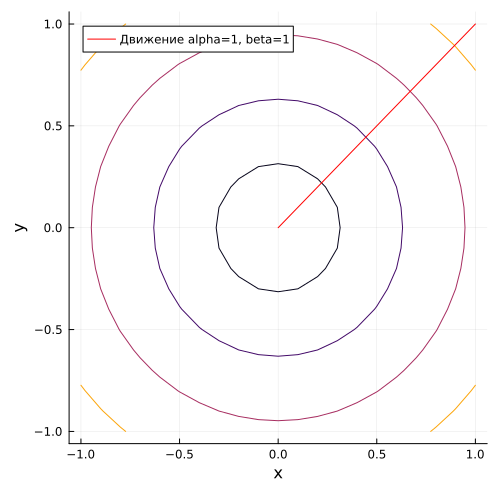

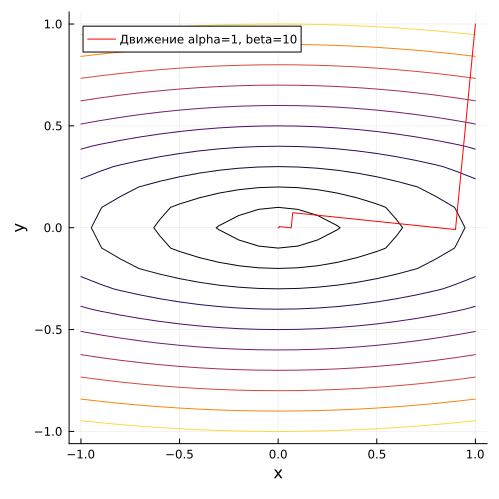

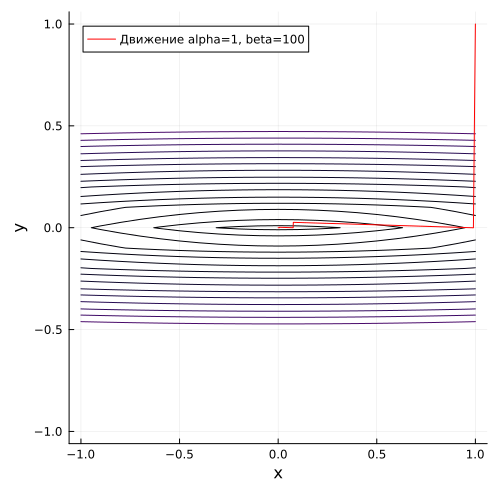

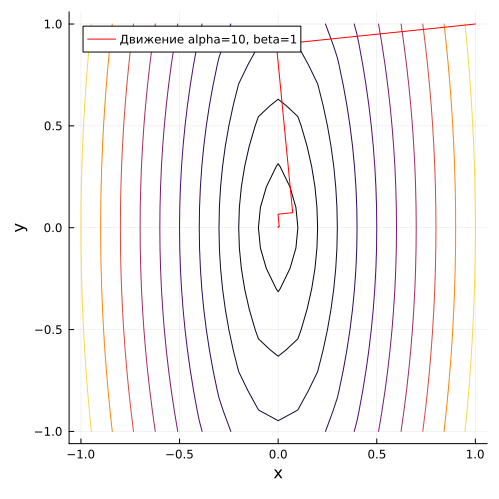

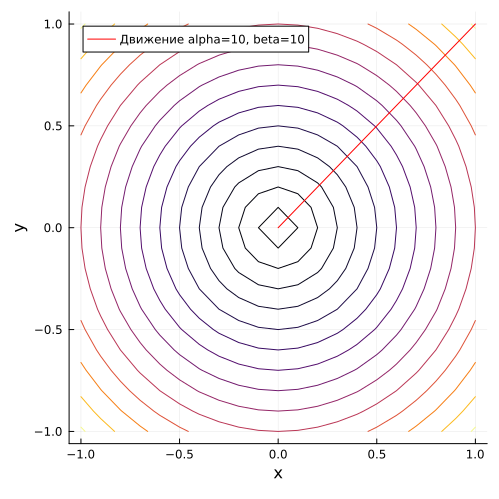

not ortogonal


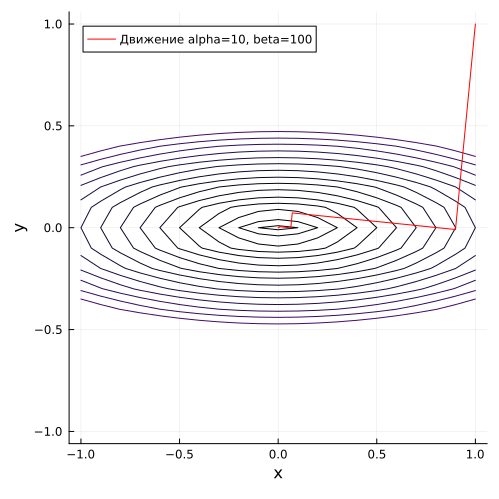

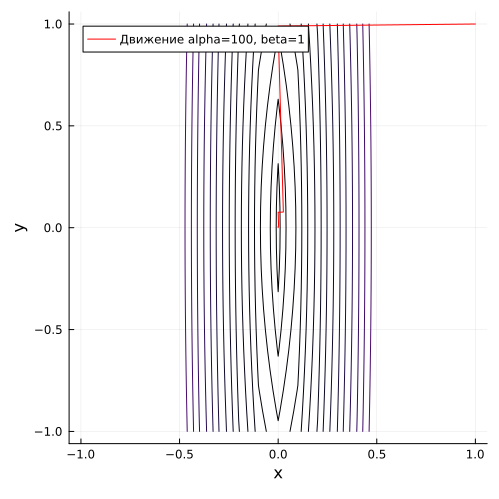

not ortogonal


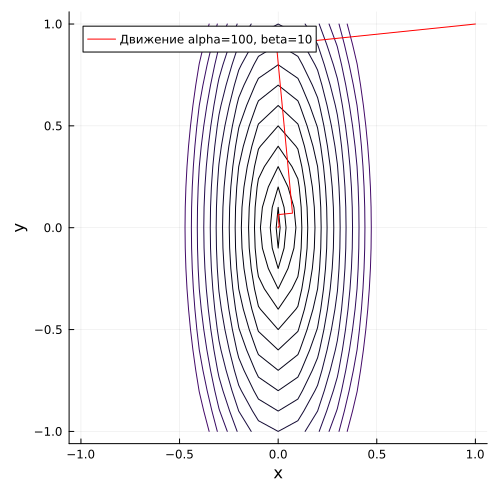

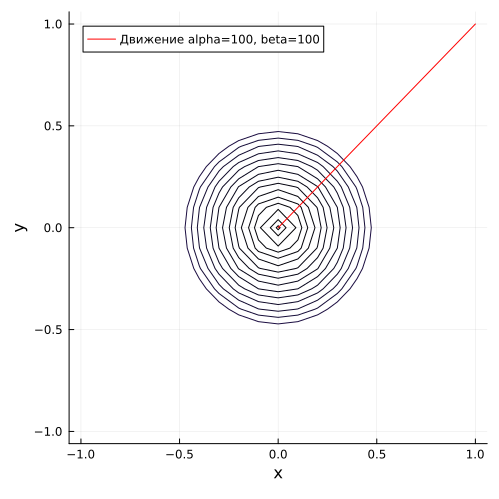

In [9]:
levels = []
for i in 1:15
    push!(levels, i^2*0.1)
end

for a in [1, 10, 100], b in [1, 10, 100]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = gradient_descent(f, x0)
    x_coords = [point[1] for point in trajectory]
    y_coords = [point[2] for point in trajectory]
    x = -1:0.1:1
    y = -1:0.1:1
    contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
    p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
    display(p)
end

## Метод сопряженных градиентов

In [10]:
function conjugate_gradient(f, x0)
    eps1, eps2 = 1e-6, 1e-10
    x = x0
    prev_x = copy(x)
    grad = gradient(f, x)
    d = -grad
    trajectory = [x]
    
    while true
        prev_grad=copy(grad)
        l, r = swann_method(alpha -> f(x + alpha * d), 1e-7)
        alpha = golden_section_search(alpha -> f(x + alpha * d), l, r)
        x += alpha * d
        grad = gradient(f, x)

        if norm(x - prev_x) < eps1 || norm(f(x) - f(prev_x)) < eps2
            break
        end

        beta = dot(grad, grad) / dot(prev_grad, prev_grad)
        d = -grad + beta * d
        prev_x = copy(x)
        push!(trajectory, x)
    end
    
    return x, trajectory
end

x_min, trajectory = conjugate_gradient(f, x0)
print("Точка минимума: ", x_min, "; Количество итераций: ", length(trajectory)-1)

Точка минимума: [5.220182523152289e-15, 5.220182523152289e-15]; Количество итераций: 2

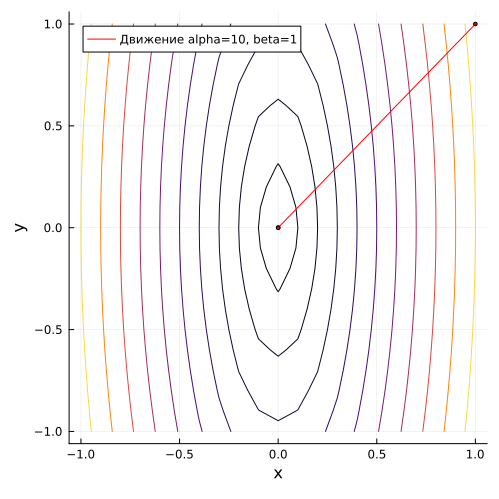

In [11]:
alpha, beta = 10, 1
func(x, y) = alpha * x^2 + beta * y ^ 2
f(x) = func(x[1],x[2])
x0 = [1.0, 1.0]
print()

x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]

x = -1:0.1:1
y = -1:0.1:1


contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
display(p)

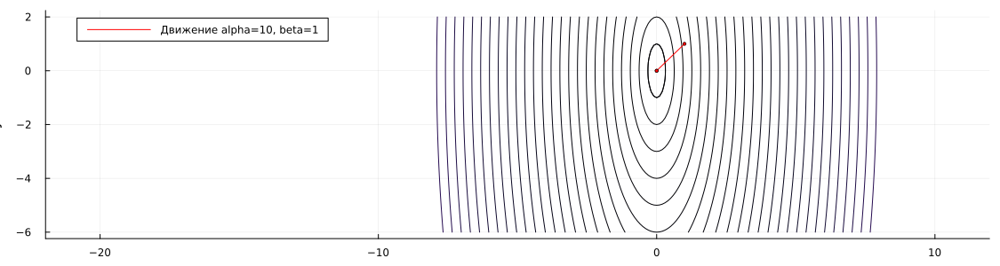

In [12]:
x = -21:0.1:11
y = -6:0.1:2
levels = []
for i in -1:25
    push!(levels, i^2)
end

contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(1125, 300))
p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p

In [13]:
for a in [1, 5, 500], b in [1, 5, 500]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = conjugate_gradient(f, x0)
    println("α=$a, β=$b: Количество итераций= $(length(trajectory)-1)")
end

α=1, β=1: Количество итераций= 1
α=1, β=5: Количество итераций= 3
α=1, β=500: Количество итераций= 6
α=5, β=1: Количество итераций= 3
α=5, β=5: Количество итераций= 1
α=5, β=500: Количество итераций= 6
α=500, β=1: Количество итераций= 6
α=500, β=5: Количество итераций= 6
α=500, β=500: Количество итераций= 2


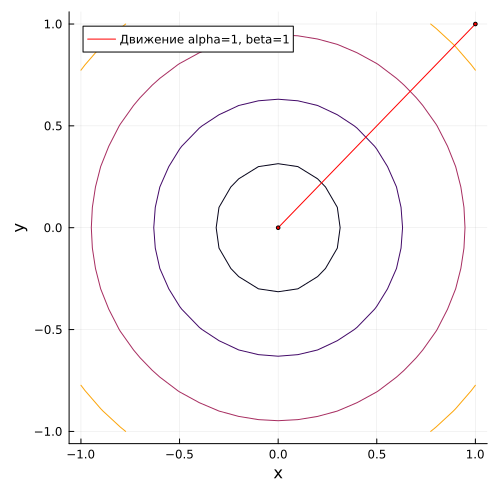

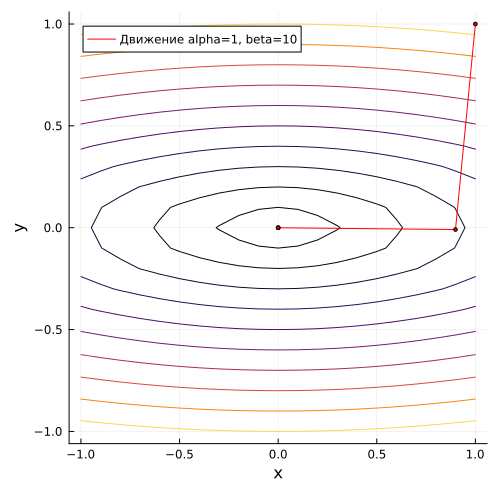

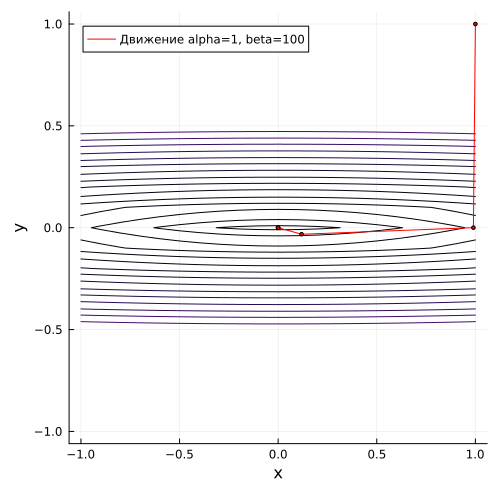

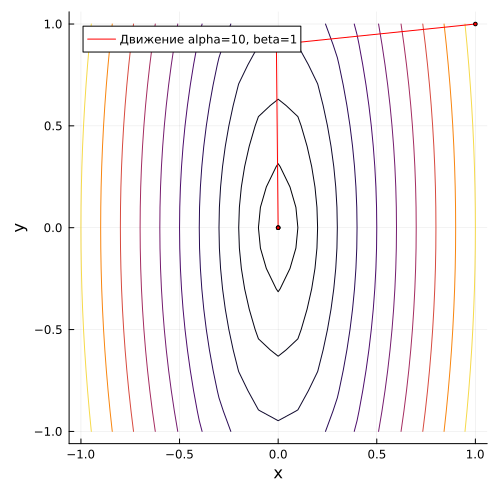

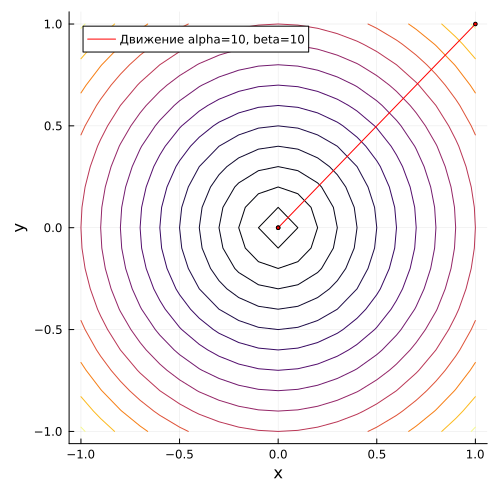

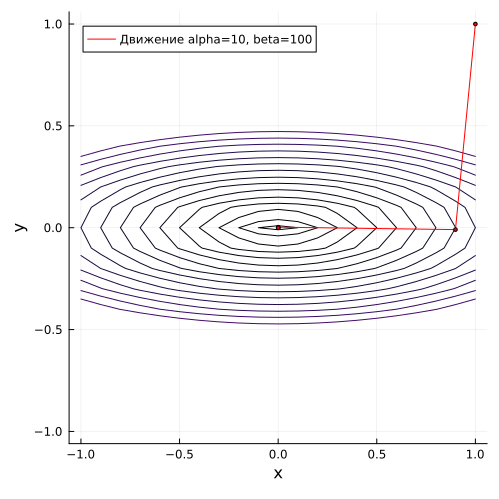

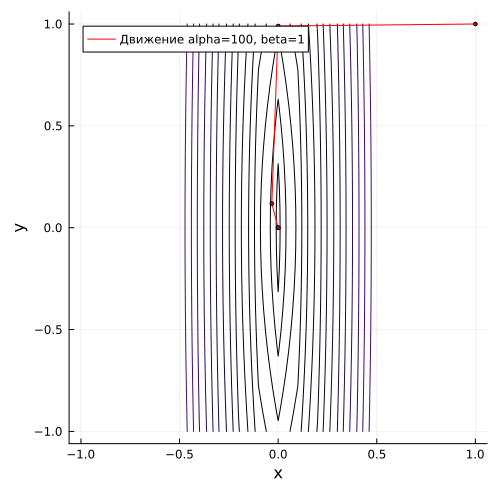

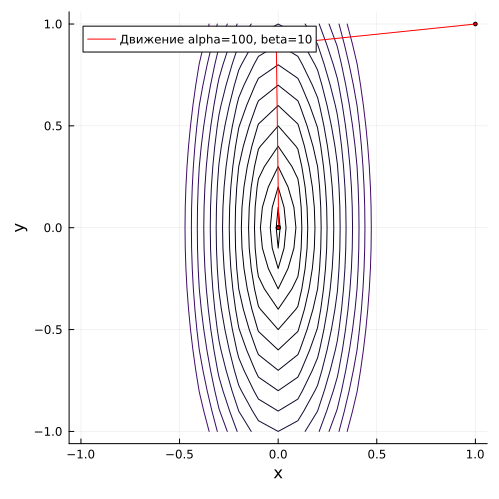

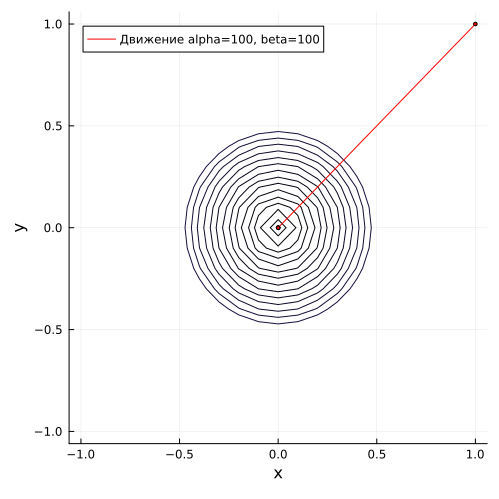

In [14]:
levels = []
for i in 1:15
    push!(levels, i^2*0.1)
end

for a in [1, 10, 100], b in [1, 10, 100]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = conjugate_gradient(f, x0)
    x_coords = [point[1] for point in trajectory]
    y_coords = [point[2] for point in trajectory]
    x = -1:0.1:1
    y = -1:0.1:1
    contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
    p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
    scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
    display(p)
end

## Покоординатный метод

In [15]:
function coordinate_descent(f, x0)
    eps1, eps2 = 1e-6, 1e-10
    x = x0
    n = length(x)
    trajectory = [x]
    alpha = 0.3
    e = []
    for i in 1:n
        ei = zeros(n)
        ei[i] = 1
        push!(e, ei)
    end
    
    while true
        x_new = copy(x)
        min_f = f(x)
        i1 = 1
        ok = false
        while true
            for i in 1:n
                for j in [-1, 1]
                    xi = copy(x)
                    xi[i] += alpha*j
                    if f(xi) <= min_f
                        x_new = xi
                        i1 = i
                        min_f = f(xi)
                        ok = true
                    end
                end
            end
            if ok
                break
            end
            alpha /= 2
        end

        if norm(x - x_new) < eps1 || norm(f(x) - f(x_new)) < eps2
            break
        end

        x = copy(x_new)
        push!(trajectory, x)
    end
    
    return x, trajectory
end

x_min, trajectory = coordinate_descent(f, x0)
print("Точка минимума: ", x_min, "; Количество итераций: ", length(trajectory)-1)


Точка минимума: [-7.629394531435037e-7, -7.629394531435037e-7]; Количество итераций: 40

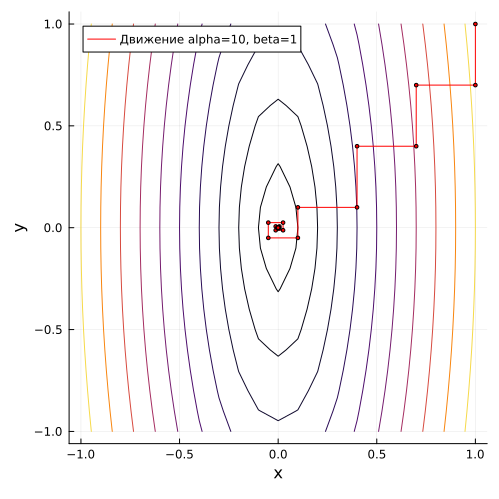

In [16]:
alpha, beta = 10, 1
func(x, y) = alpha * x^2 + beta * y ^ 2
f(x) = func(x[1],x[2])
x0 = [1.0, 1.0]
print()

x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]

x = -1:0.1:1
y = -1:0.1:1
levels = []
for i in 1:20
    push!(levels, i^2*0.1)
end
contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
display(p)

In [17]:
for a in [1, 5, 500], b in [1, 5, 500]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = coordinate_descent(f, x0)
    println("α=$a, β=$b: Количество итераций = $(length(trajectory)-1)")
end

α=1, β=1: Количество итераций = 34
α=1, β=5: Количество итераций = 35
α=1, β=500: Количество итераций = 35
α=5, β=1: Количество итераций = 35
α=5, β=5: Количество итераций = 36
α=5, β=500: Количество итераций = 37
α=500, β=1: Количество итераций = 35
α=500, β=5: Количество итераций = 37
α=500, β=500: Количество итераций = 42


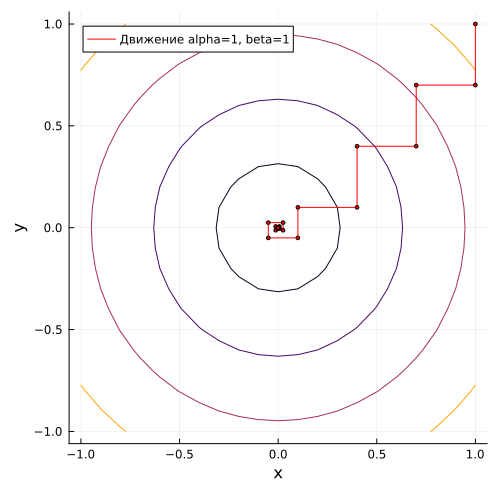

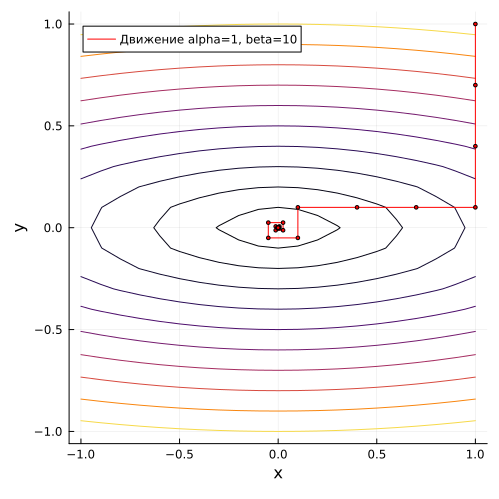

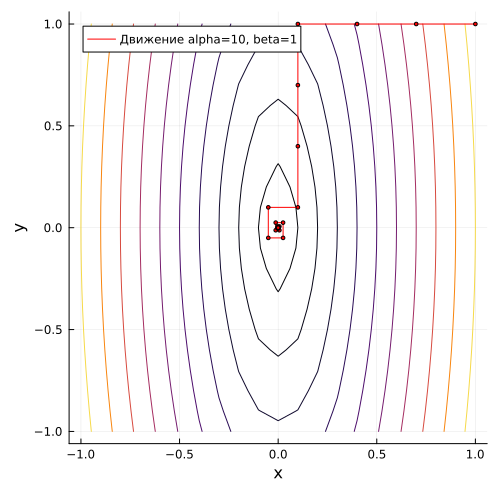

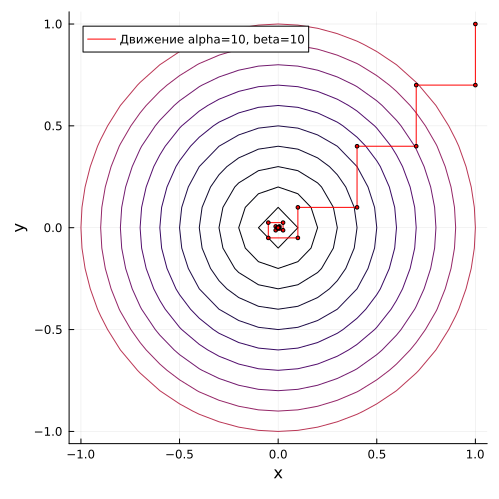

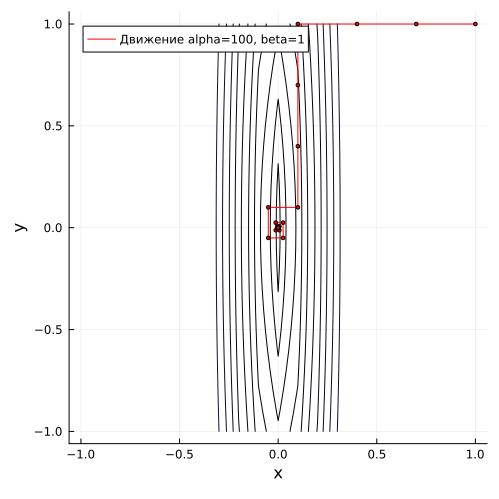

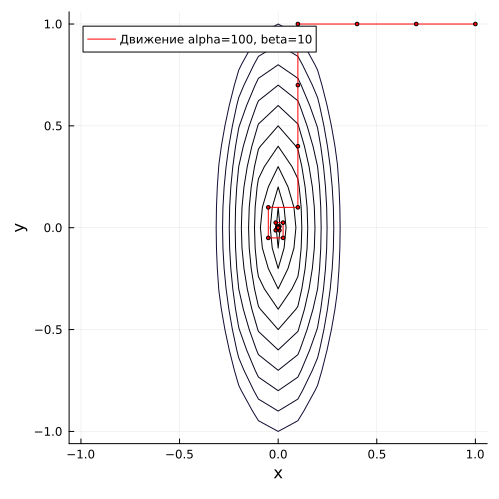

In [18]:
levels = []
for i in 1:10
    push!(levels, i^2*0.1)
end

for a in [1, 10, 100], b in [1, 10]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = coordinate_descent(f, x0)
    x_coords = [point[1] for point in trajectory]
    y_coords = [point[2] for point in trajectory]
    x = -1:0.1:1
    y = -1:0.1:1
    contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
    p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
    scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
    display(p)
end

## Метод Гаусса-Зейделя

In [19]:
function gauss_zeidel(f, x0)
    eps1, eps2 = 1e-6, 1e-10
    x = x0
    n = length(x)
    trajectory = [x]
    alpha = 0.1
    e = []
    for i in 1:n
        ei = zeros(n)
        ei[i] = 1
        push!(e, ei)
    end
    
    while true
        x_new = copy(x)
        min_f = f(x)
        i1 = 1
        for i in 1:n
            for j in [-1, 1]
                function g(alpha)
                    xi = copy(x)
                    xi[i] += alpha*j
                    return f(xi)
                end
                l, r = swann_method(g, 0.1)
                alpha = golden_section_search(g, l, r)
                xi = copy(x)
                xi[i] += alpha*j
                if f(xi) < min_f
                    x_new = xi
                    i1 = i
                    min_f = f(xi)
                end
            end
        end

        if norm(x - x_new) < eps1 || norm(f(x) - f(x_new)) < eps2
            break
        end

        x = copy(x_new)
        push!(trajectory, x)
    end
    
    return x, trajectory
end

x_min, trajectory = gauss_zeidel(f, x0)
print("Точка минимума: ", x_min, "; Количество итераций: ", length(trajectory)-1)

Точка минимума: [-2.814336796941319e-7, -2.814336796941319e-7]; Количество итераций: 2

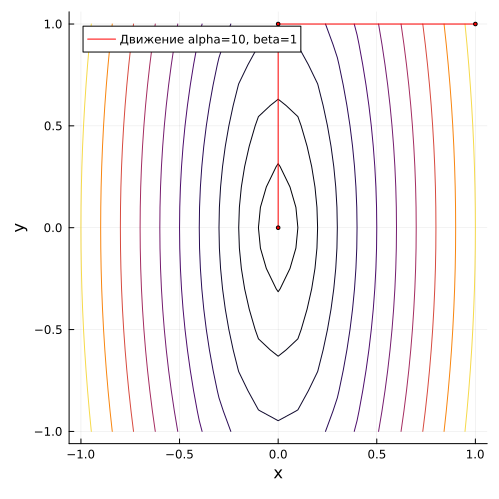

In [20]:
alpha, beta = 10, 1
func(x, y) = alpha * x^2 + beta * y ^ 2
f(x) = func(x[1],x[2])
x0 = [1.0, 1.0]
print()

x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]

x = -1:0.1:1
y = -1:0.1:1
levels = []
for i in 1:10
    push!(levels, i^2*0.1)
end
contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
display(p)

In [21]:
for a in [1, 5, 500], b in [1, 5, 500]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = gauss_zeidel(f, x0)
    println("α=$a, β=$b: Количество итераций= $(length(trajectory)-1)")
end

α=1, β=1: Количество итераций= 2
α=1, β=5: Количество итераций= 2
α=1, β=500: Количество итераций= 2
α=5, β=1: Количество итераций= 2
α=5, β=5: Количество итераций= 2
α=5, β=500: Количество итераций= 2
α=500, β=1: Количество итераций= 2
α=500, β=5: Количество итераций= 2
α=500, β=500: Количество итераций= 2


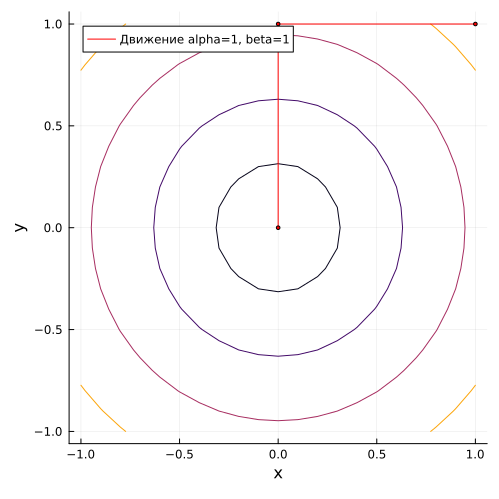

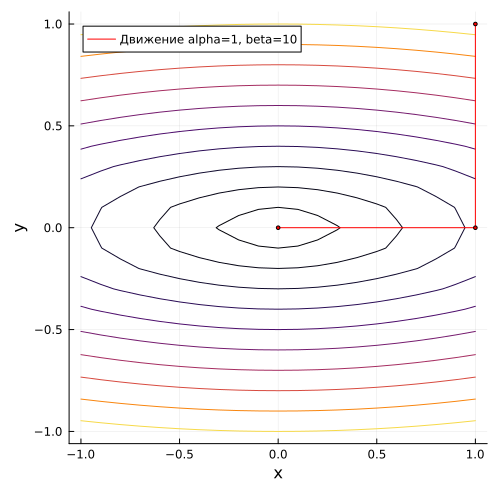

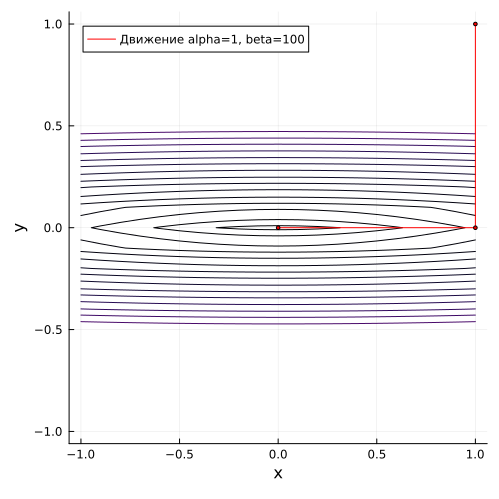

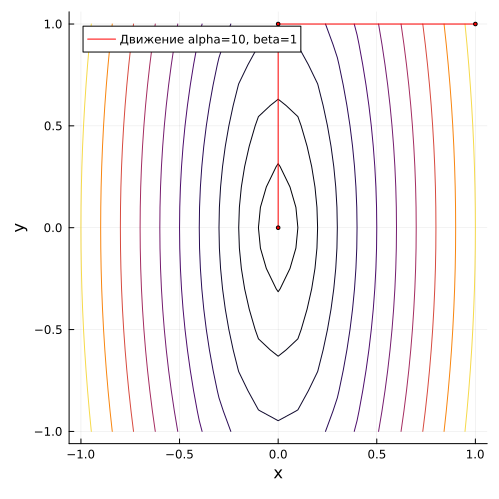

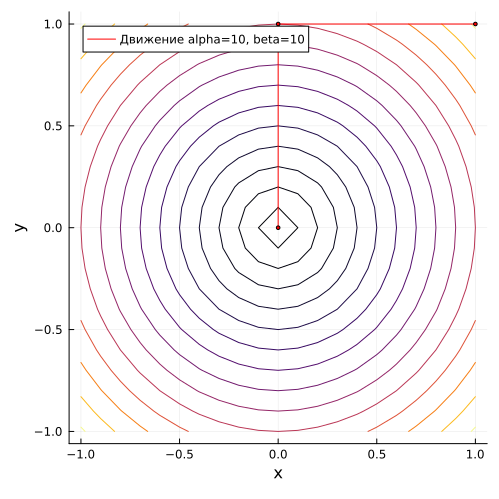

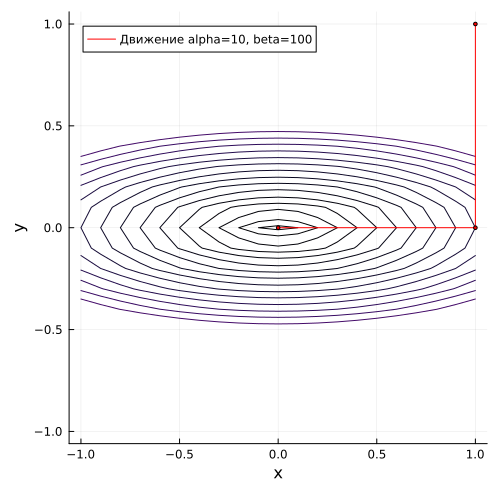

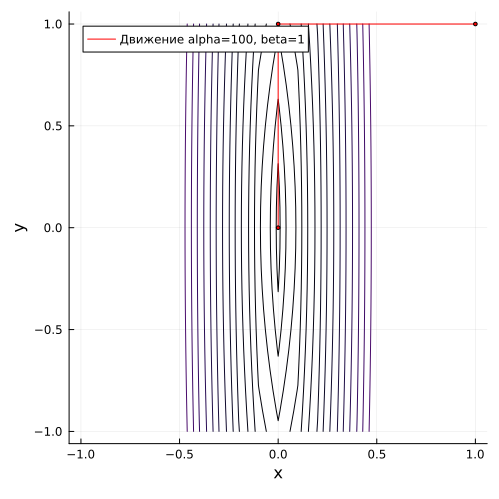

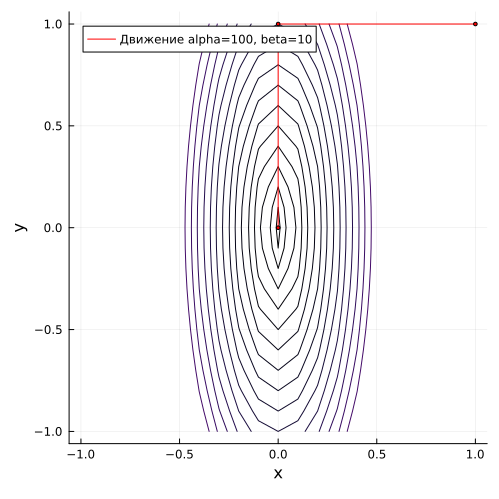

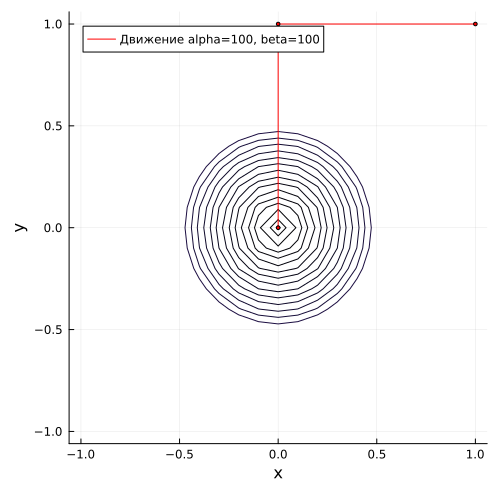

In [22]:
levels = []
for i in 1:15
    push!(levels, i^2*0.1)
end

for a in [1, 10,100], b in [1, 10, 100]
    alpha, beta = a, b
    func(x, y) = alpha * x^2 + beta * y ^ 2
    x_min, trajectory = gauss_zeidel(f, x0)
    x_coords = [point[1] for point in trajectory]
    y_coords = [point[2] for point in trajectory]
    x = -1:0.1:1
    y = -1:0.1:1
    contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
    p = plot!(x_coords, y_coords, label="Движение alpha=$alpha, beta=$beta", line=:red)
    scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
    display(p)
end

### функция Розенброка

In [23]:
func(x, y) = (1-x)^2 +100*(y-x^2)^2
f(x) = func(x[1],x[2])
x0 = [2.0, 2.0]
print()

In [24]:
x = -2:0.1:2
y = -2:0.1:2
levels = []
for i in 1:10
    push!(levels, i^2*0.1)
end

Метод наискорейшего спуска:
 точка минимума: [1.0000933224794915, 1.0001891806668428]
 кол-во итераций = 367


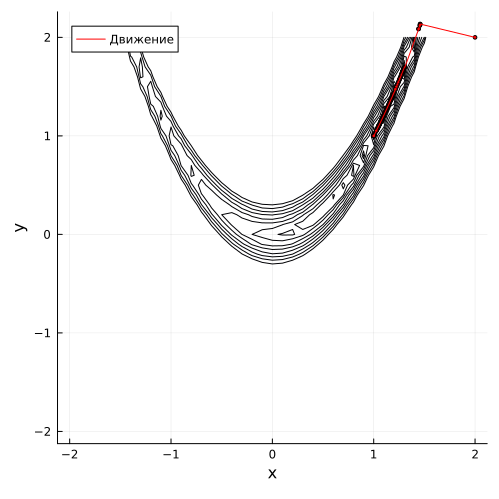

In [25]:
x_min, trajectory = gradient_descent(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Метод наискорейшего спуска:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

Метод споряженных градиентов:
 точка минимума: [0.9999942529858412, 0.999988482684302]
 кол-во итераций = 9


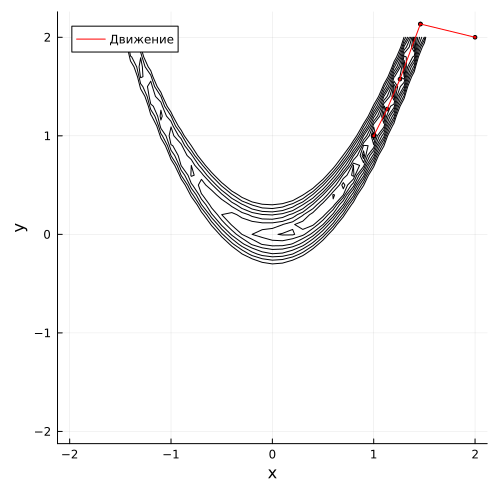

In [26]:
x_min, trajectory = conjugate_gradient(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Метод споряженных градиентов:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

Покоординатный метод:
 точка минимума: [1.0027618408203325, 1.0055358886719339]
 кол-во итераций = 7238


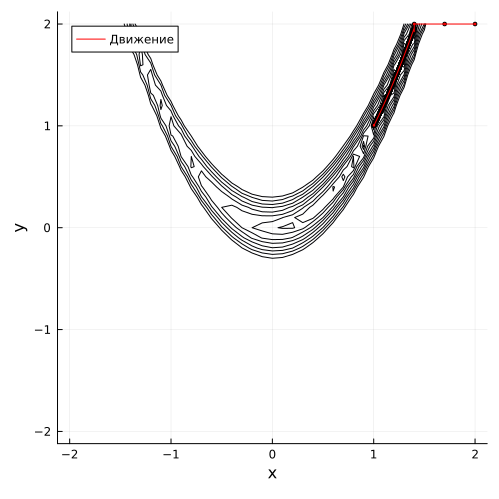

In [27]:
x_min, trajectory = coordinate_descent(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Покоординатный метод:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

Метод Гаусса-Зейделя:
 точка минимума: [1.0005489927385383, 1.0010992136448535]
 кол-во итераций = 6018


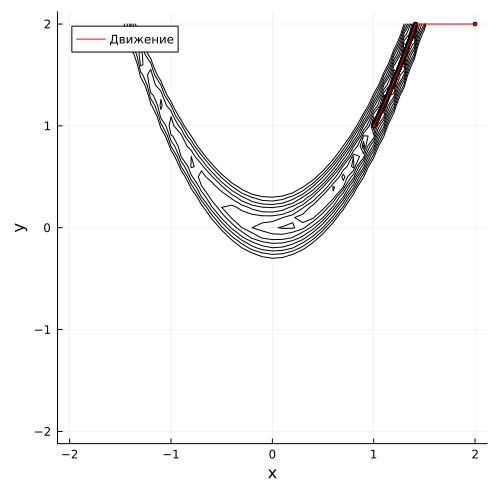

In [28]:
x_min, trajectory = gauss_zeidel(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = levels, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Метод Гаусса-Зейделя:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

### функция по индивидуальному варианту

In [35]:
func(x, y) = (x-4*y)^2 +(y+5)^2
f(x) = func(x[1],x[2])
x0 = [10.0, -5.0] 
print()

In [59]:
x = -20:0.1:10
y = -20:0.1:20

-20.0:0.1:20.0

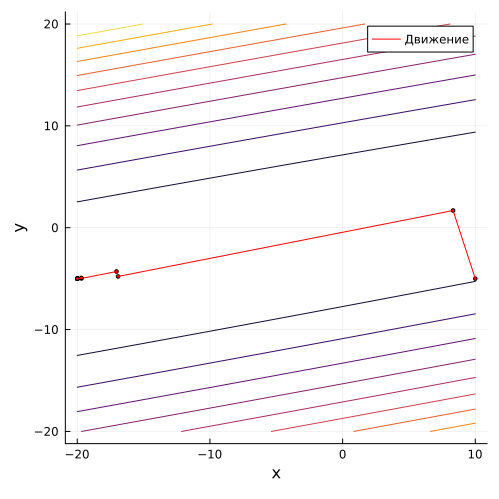

Метод наискорейшего спуска:
 точка минимума: [-19.99996392778502, -4.999991482248023]
 кол-во итераций = 13


In [60]:
x_min, trajectory = gradient_descent(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = 10, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Метод наискорейшего спуска:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

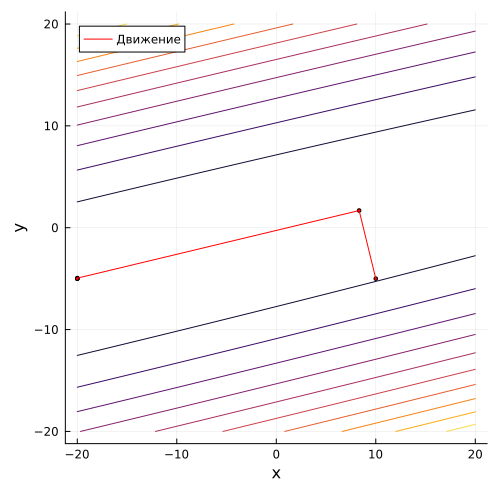

Метод споряженных градиентов:
 точка минимума: [-20.00000002844816, -5.0000000067147665]
 кол-во итераций = 5


In [57]:
x_min, trajectory = conjugate_gradient(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = 10, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Метод споряженных градиентов:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

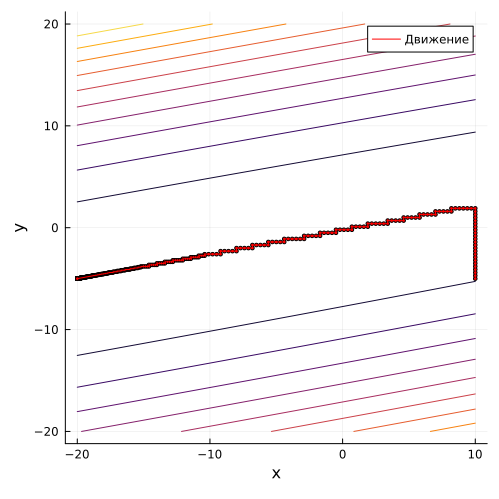

Покоординатный метод:
 точка минимума: [-19.99951477050782, -4.999880981445314]
 кол-во итераций = 680


In [61]:
x_min, trajectory = coordinate_descent(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = 10, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Покоординатный метод:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p

Метод Гаусса-Зейделя:
 точка минимума: [-19.999999444871357, -5.0]
 кол-во итераций = 1


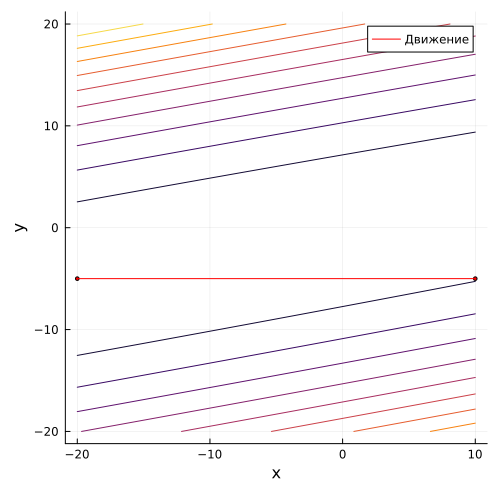

In [62]:
x_min, trajectory = gauss_zeidel(f, x0)
x_coords = [point[1] for point in trajectory]
y_coords = [point[2] for point in trajectory]
contour(x, y, (x, y) -> f([x, y]), levels = 10, xlabel="x", ylabel="y", colorbar=false, size=(500, 500))
scatter!(x_coords, y_coords, markersize=2, markershape=:circle, markercolor=:red, label = "")
p = plot!(x_coords, y_coords, label="Движение", line=:red)
println("Метод Гаусса-Зейделя:\n точка минимума: $x_min\n кол-во итераций = $(length(trajectory)-1)")
p